In [1]:
import pandas as pd
from explorer_lib import *
import seaborn as sns
import matplotlib.pyplot as plt 
import hvplot.pandas
from random import sample
import torch
from sklearn.metrics import pairwise
import numpy as np

%load_ext autoreload
%autoreload 2


In [2]:
colors_sns = sns.color_palette('colorblind')
colors_sns

[(0.00392156862745098, 0.45098039215686275, 0.6980392156862745),
 (0.8705882352941177, 0.5607843137254902, 0.0196078431372549),
 (0.00784313725490196, 0.6196078431372549, 0.45098039215686275),
 (0.8352941176470589, 0.3686274509803922, 0.0),
 (0.8, 0.47058823529411764, 0.7372549019607844),
 (0.792156862745098, 0.5686274509803921, 0.3803921568627451),
 (0.984313725490196, 0.6862745098039216, 0.8941176470588236),
 (0.5803921568627451, 0.5803921568627451, 0.5803921568627451),
 (0.9254901960784314, 0.8823529411764706, 0.2),
 (0.33725490196078434, 0.7058823529411765, 0.9137254901960784)]

In [3]:
fn_in = '/home/ajinich/Dropbox/KyuRhee/unknown_function/unknown_redox/data/mohammed/df_mtb_smeg_umap.csv'
df_mtb_smeg = pd.read_csv(fn_in)

df_temp = df_mtb_smeg[df_mtb_smeg.annot_int >= 4]

# GLS correlations: 

In [4]:
norm = 0
df_interact, df_lfc, df_mtb_w_loc, dict_rvid_to_name = import_interact_lfc_uniprot(norm)

/home/ajinich/miniconda3/lib/python3.8/site-packages/openpyxl/styles/stylesheet.py:221: UserWarning: Workbook contains no default style, apply openpyxl's default
  warn("Workbook contains no default style, apply openpyxl's default")


In [5]:
df_interact.head(2)

,lead_gene,partner_gene,p_value_FDR
0,Rv0001,Rv0062,1.962568e-04
1,Rv0001,Rv0283,4.421194e-09


In [29]:
rvid_query = 'Rv3137' #'Rv1300' #'Rv2165c' 
list_rvid_NN1, list_rvid_NN2, list_rvid_NN3 = get_NN12(rvid_query, df_interact)
# list_rvid = sample(list_rvid_NN1, 10)
list_rvid = list_rvid_NN1.copy()
list_subset= []
# list_subset =  ['Rv1901'] # ['Rv3044']
len(list_rvid_NN1), len(list_rvid_NN2),len(list_rvid_NN3)

(29, 137, 391)

PDIM figure specific:

In [30]:
# rvid_query = 'Rv2936' # 'Rv2930'
# list_rvid_NN1, list_rvid_NN2, list_rvid_NN3 = get_NN12(rvid_query, df_interact)

# list_rvid += list_rvid_NN2
# list_rvid.sort()
# list_subset = list_rvid_NN2.copy()


In [31]:
# df_mtb_w_loc[df_mtb_w_loc.Rv_ID.isin(list_rvid)].sort_values(by = 'Rv_ID').head(1)

### [PENDING]: 

lower alpha value for scatter plots that are not significant


In [32]:
# list_rvid = list_rvid[-20:]

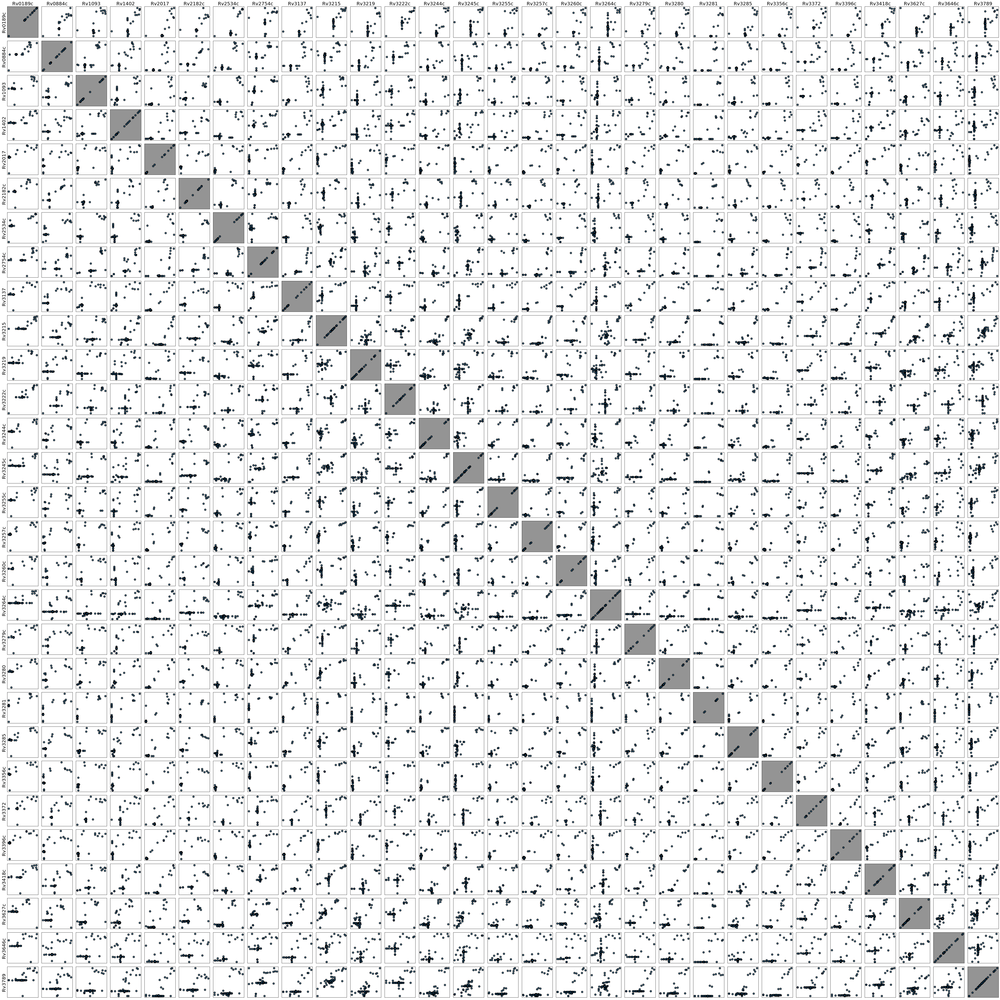

In [33]:
len_width = int(len(list_rvid)*2.0)
# correlation_tile_plot(df_lfc_basis_norm_invitro, list_rvid_NN1, list_rvid_NN1, (len_width,len_width), colors_sns, dict_rvid_to_name, list_subset = [], gene_names = True)
correlation_tile_plot(df_lfc, list_rvid, list_rvid, (len_width,len_width), colors_sns, dict_rvid_to_name, list_subset = list_subset, gene_names = False)
plt.tight_layout()

# ESM: 

In [13]:
if len(list_rvid) == 0:
    list_rvid = [rvid_query]
df_rvid = df_mtb_smeg[df_mtb_smeg.Rv_ID.isin(list_rvid)].copy()
df_rvid.sort_values(by = 'Annotation', ascending=False)

,Entry,Entry name,Status,Protein names,Gene names,Organism,Length,Annotation,Rhea ID,EC number,...,Sequence,Function [CC],Cross-reference (InterPro),annot_int,organism,Rv_ID,u1,u2,u3,cluster_labels
6957,P9WG77,THID_MYCTU,reviewed,Hydroxymethylpyrimidine/phosphomethylpyrimidin...,thiD Rv0422c MTCY22G10.19c,Mycobacterium tuberculosis (strain ATCC 25618 ...,265.0,3 out of 5,RHEA:23096; RHEA:19893,2.7.1.49; 2.7.4.7,...,MTPPRVLSIAGSDSGGGAGIQADMRTMALLGVHACVAVTAVTVQNT...,FUNCTION: Catalyzes the phosphorylation of hyd...,NaN,3,mtb,Rv0422c,12.843766,3.589231,3.996835,42
7084,O06409,O06409_MYCTU,unreviewed,Conserved protein,Rv0543c,Mycobacterium tuberculosis (strain ATCC 25618 ...,100.0,1 out of 5,NaN,NaN,...,MNRFLTSIVAWLRAGYPEGIPPTDSFAVLALLCRRLSHDEVKAVAN...,NaN,NaN,1,mtb,Rv0543c,10.452130,0.288566,5.283569,75
10124,O06283,O06283_MYCTU,unreviewed,Hypothetical short protein,Rv3599c,Mycobacterium tuberculosis (strain ATCC 25618 ...,27.0,1 out of 5,NaN,NaN,...,MPASSLGTGSPAADRLDATHERRREVI,NaN,NaN,1,mtb,Rv3599c,8.287591,-3.630723,5.638516,11


In [14]:
hv1 = df_mtb_smeg.hvplot.scatter(x="u1", y="u2", padding=0.05, width = 1500, height = 1200, size = 100, alpha = 0.7, hover_cols=["Rv_ID", "Gene names", "Entry", "Protein names", "Annotation", "Length"], line_color='k', c="organism")
hv2 = df_temp.hvplot.scatter(x="u1", y="u2", size = 400, alpha = 0.25, color = colors_sns[6], line_color = 'k', marker='s')
hv3 = df_rvid.hvplot.scatter(x='u1', y='u2', size = 600, alpha = 0.5, color='k')
(hv1*hv2*hv3)

:Overlay
   .Scatter.I   :Scatter   [u1]   (u2,organism,Rv_ID,Gene names,Entry,Protein names,Annotation,Length)
   .Scatter.II  :Scatter   [u1]   (u2)
   .Scatter.III :Scatter   [u1]   (u2)

# Interactive scatter plot:

In [21]:
list_hv = interactive_scatter_grid(df_lfc, list_rvid)
for hv in list_hv:
    display(hv)

:NdLayout   [Rv_ID]
   :Scatter   [Rv0014c]   (value,screen)

:NdLayout   [Rv_ID]
   :Scatter   [Rv0509]   (value,screen)

:NdLayout   [Rv_ID]
   :Scatter   [Rv0640]   (value,screen)

:NdLayout   [Rv_ID]
   :Scatter   [Rv0718]   (value,screen)

:NdLayout   [Rv_ID]
   :Scatter   [Rv1177]   (value,screen)

:NdLayout   [Rv_ID]
   :Scatter   [Rv1415]   (value,screen)

:NdLayout   [Rv_ID]
   :Scatter   [Rv2247]   (value,screen)

:NdLayout   [Rv_ID]
   :Scatter   [Rv2421c]   (value,screen)

:NdLayout   [Rv_ID]
   :Scatter   [Rv2460c]   (value,screen)

:NdLayout   [Rv_ID]
   :Scatter   [Rv2676c]   (value,screen)

:NdLayout   [Rv_ID]
   :Scatter   [Rv3246c]   (value,screen)

:NdLayout   [Rv_ID]
   :Scatter   [Rv3460c]   (value,screen)

:NdLayout   [Rv_ID]
   :Scatter   [Rv3587c]   (value,screen)

:NdLayout   [Rv_ID]
   :Scatter   [Rv3764c]   (value,screen)

:NdLayout   [Rv_ID]
   :Scatter   [value]   (value,screen)

# Cosine distance similarity:

Querying Mtb Msm protein:

In [16]:
X, df_mtb_smeg, list_entries = load_ESM_embeddings_and_df()

In [17]:
ind_query = df_mtb_smeg[df_mtb_smeg.Rv_ID == rvid_query].index[0]
# ind_query = df_mtb_smeg[df_mtb_smeg.Rv_ID == rvid_query].index[1]
perc_th = 0.5
df_th = get_similar_prots(X, df_mtb_smeg, ind_query, list_entries, perc_th)

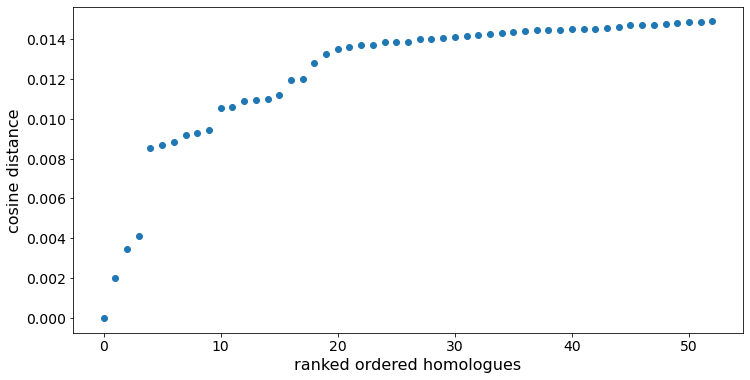

In [18]:
plt.figure(figsize = (12, 6))
plt.plot(df_th.d.values, 'o')
plt.xlabel('ranked ordered homologues', fontsize = 16)
yl = plt.ylabel('cosine distance', fontsize = 16)
xt = plt.xticks(fontsize = 14)
yt = plt.yticks(fontsize = 14)

In [21]:
df_th.head(10)[['Entry', 'Gene names', 'Annotation']]

,Entry,Gene names,Annotation
0,O06409,Rv0543c,1 out of 5
1,A0QRC1,MSMEG_1063,1 out of 5
2,A0QRC4,MSMEG_1066,1 out of 5
3,I6YF16,Rv3046c,1 out of 5
4,A0QNU0,MSMEG_0162,1 out of 5
5,A0QYE2,ureA MSMEG_3627 MSMEI_3542,2 out of 5
6,A0QPF4,MSMEG_0379,1 out of 5
7,O07756,Rv1873,1 out of 5
8,A0QY92,MSMEG_3577,1 out of 5
9,P9WFE7,ureA Rv1848 MTCY359.25c,3 out of 5


In [15]:
df_th[df_th.Organism.str.contains('H37Rv')].head(7)

,Entry,d,Entry name,Status,Protein names,Gene names,Organism,Length,Annotation,Rhea ID,...,Sequence,Function [CC],Cross-reference (InterPro),annot_int,organism,Rv_ID,u1,u2,u3,cluster_labels
0,P9WHG9,-1.192093e-07,RELA_MYCTU,reviewed,Bifunctional (p)ppGpp synthase/hydrolase RelA ...,relA Rv2583c MTCY227.18,Mycobacterium tuberculosis (strain ATCC 25618 ...,738.0,5 out of 5,RHEA:14253; RHEA:22088,...,MTAQRSTTNPVLEPLVAVHREIYPKADLSILQRAYEVADQRHASQL...,FUNCTION: In eubacteria ppGpp (guanosine 3'-di...,,5,mtb,Rv2583c,13.172074,1.919902,4.598116,47
2,P9WFW7,1.111269e-02,SYA_MYCTU,reviewed,Alanine--tRNA ligase (EC 6.1.1.7) (Alanyl-tRNA...,alaS Rv2555c MTCY159.01 MTCYW318.01c,Mycobacterium tuberculosis (strain ATCC 25618 ...,904.0,3 out of 5,RHEA:12540,...,MQTHEIRKRFLDHFVKAGHTEVPSASVILDDPNLLFVNAGMVQFVP...,FUNCTION: Catalyzes the attachment of alanine ...,,3,mtb,Rv2555c,13.248959,1.799713,4.385769,0
5,P9WFT5,1.228267e-02,SYT_MYCTU,reviewed,Threonine--tRNA ligase (EC 6.1.1.3) (Threonyl-...,thrS Rv2614c MTCY1A10.20,Mycobacterium tuberculosis (strain ATCC 25618 ...,692.0,3 out of 5,RHEA:24624,...,MSAPAQPAPGVDGGDPSQARIRVPAGTTAATAVGEAGLPRRGTPDA...,FUNCTION: Catalyzes the attachment of threonin...,,3,mtb,Rv2614c,13.327928,1.770806,4.420364,51
7,P9WG47,1.262587e-02,GYRA_MYCTU,reviewed,DNA gyrase subunit A (EC 5.6.2.2) (Type IIA to...,gyrA Rv0006 MTCY10H4.04,Mycobacterium tuberculosis (strain ATCC 25618 ...,838.0,5 out of 5,,...,MTDTTLPPDDSLDRIEPVDIEQEMQRSYIDYAMSVIVGRALPEVRD...,FUNCTION: A type II topoisomerase that negativ...,,5,mtb,Rv0006,13.250721,1.765622,4.527263,0
12,O53289,1.288235e-02,SERB2_MYCTU,reviewed,Phosphoserine phosphatase SerB2 (PSP) (PSPase)...,serB2 Rv3042c,Mycobacterium tuberculosis (strain ATCC 25618 ...,409.0,5 out of 5,RHEA:21208; RHEA:24873; RHEA:20629; RHEA:47004,...,MPAKVSVLITVTGMDQPGVTSALFEVLAQHGVELLNVEQVVIRGRL...,FUNCTION: Catalyzes the dephosphorylation of O...,,5,mtb,Rv3042c,12.286264,2.884197,4.326216,15
13,P9WNU5,1.305276e-02,DPO1_MYCTU,reviewed,DNA polymerase I (POL I) (EC 2.7.7.7),polA Rv1629 MTCY01B2.21,Mycobacterium tuberculosis (strain ATCC 25618 ...,904.0,4 out of 5,RHEA:22508,...,MVTTASAPSEDRAKPTLMLLDGNSLAFRAFYALPAENFKTRGGLTT...,"FUNCTION: In addition to polymerase activity, ...",,4,mtb,Rv1629,13.085185,2.310476,4.895635,47
14,P9WN79,1.317781e-02,GLPD2_MYCTU,reviewed,Glycerol-3-phosphate dehydrogenase 2 (EC 1.1.5.3),glpD2 Rv3302c MTCI418A.04c MTV016.01c,Mycobacterium tuberculosis (strain ATCC 25618 ...,585.0,2 out of 5,RHEA:18977,...,MSNPIQAPDGGQGWPAAALGPAQRAVAWKRLGTEQFDVVVIGGGVV...,,,2,mtb,Rv3302c,11.783493,2.849157,3.649791,57


In [16]:
df_mtb_ESM = df_th[df_th.Organism.str.contains('H37Rv')].copy()
df_msm_ESM = df_th[df_th.Organism.str.contains('smeg')].copy()
df_mtb_ESM.reset_index(inplace=True, drop=True)
df_msm_ESM.reset_index(inplace=True, drop=True)

In [21]:
df_msm_ESM

,Entry,d,Entry name,Status,Protein names,Gene names,Organism,Length,Annotation,Rhea ID,...,Sequence,Function [CC],Cross-reference (InterPro),annot_int,organism,Rv_ID,u1,u2,u3,cluster_labels
0,A0QWJ6,0.000318,A0QWJ6_MYCS2,unreviewed,GTP pyrophosphokinase (EC 2.7.6.5),relA MSMEG_2965,Mycolicibacterium smegmatis (strain ATCC 70008...,797.0,2 out of 5,,...,MVDEPGKGQAVQSPPAVPETVPKPPSGTAPTTTPAAPSTSSETARI...,FUNCTION: In eubacteria ppGpp (guanosine 3'-di...,IPR002912;IPR012675;IPR003607;IPR043519;IPR004...,2,smeg,,13.196456,1.965260,4.662282,47
1,A0QWQ4,0.011255,SYA_MYCS2,reviewed,Alanine--tRNA ligase (EC 6.1.1.7) (Alanyl-tRNA...,alaS MSMEG_3025 MSMEI_2950,Mycolicibacterium smegmatis (strain ATCC 70008...,896.0,3 out of 5,RHEA:12540,...,MQTHEIRKRFLDHFVKAGHTEVPSASVILDDPNLLFVNAGMVQFVP...,FUNCTION: Catalyzes the attachment of alanine ...,IPR002318;IPR018162;IPR018165;IPR018164;IPR023...,3,smeg,,13.318322,1.800196,4.464252,51
2,A0QW71,0.011688,A0QW71_MYCS2,unreviewed,Transcriptional accessory protein,MSMEG_2839,Mycolicibacterium smegmatis (strain ATCC 70008...,796.0,1 out of 5,,...,MPTSGPVPGVRSITARLAEELSVGEHQVAAAIHLLDEGSTVPFIAR...,,IPR041692;IPR012340;IPR012337;IPR010994;IPR022...,1,smeg,,13.162330,2.113262,4.770927,47
3,A0QWG2,0.012620,SYT_MYCS2,reviewed,Threonine--tRNA ligase (EC 6.1.1.3) (Threonyl-...,thrS MSMEG_2931 MSMEI_2857,Mycolicibacterium smegmatis (strain ATCC 70008...,684.0,3 out of 5,RHEA:24624,...,MTAVASSAPAAPIRVPAGTTAGAAVREADLPGRGAPDAIVVVRDAE...,FUNCTION: Catalyzes the attachment of threonin...,IPR002314;IPR006195;IPR004154;IPR036621;IPR004...,3,smeg,,13.325735,1.754752,4.410626,51
4,A0QRA0,0.012719,A0QRA0_MYCS2,unreviewed,O-phosphoserine phosphohydrolase (EC 3.1.3.3),serB MSMEG_1041 MSMEG_2321,Mycolicibacterium smegmatis (strain ATCC 70008...,413.0,2 out of 5,RHEA:24873; RHEA:21208,...,MSSARERSSLLITVTGVDQPGVTSALFEVLSRHKVELRNVEQVVIR...,,IPR002912;IPR036412;IPR023214;IPR023190;IPR004...,2,smeg,,12.298175,2.866924,4.320764,15
5,P48354,0.012738,GYRA_MYCS2,reviewed,DNA gyrase subunit A (EC 5.6.2.2),gyrA MSMEG_0006 MSMEI_0008,Mycolicibacterium smegmatis (strain ATCC 70008...,842.0,4 out of 5,,...,MTDTTLPPEGEAHDRIEPVDIQQEMQRSYIDYAMSVIVGRALPEVR...,FUNCTION: A type II topoisomerase that negativ...,IPR005743;IPR006691;IPR035516;IPR013760;IPR002...,4,smeg,,13.256851,1.703396,4.479614,0
6,A0QT70,0.012790,A0QT70_MYCS2,unreviewed,Glycerol-3-phosphate dehydrogenase (EC 1.1.5.3),MSMEG_1736,Mycolicibacterium smegmatis (strain ATCC 70008...,581.0,2 out of 5,RHEA:18977,...,MTVPKPAPGDGQTFLGPQQRAQAWEQLGNQQFDVVVIGGGVVGAGA...,,IPR031656;IPR038299;IPR006076;IPR036188;IPR000...,2,smeg,,11.770106,2.883847,3.708051,57
7,A0QYZ2,0.012810,A0QYZ2_MYCS2,unreviewed,DNA polymerase I (EC 2.7.7.7),polA MSMEG_3839,Mycolicibacterium smegmatis (strain ATCC 70008...,908.0,2 out of 5,RHEA:22508,...,MSPAKTATKKTPAKAADDTPTLMLLDGNSLAFRAFYALPAENFKTQ...,"FUNCTION: In addition to polymerase activity, ...",IPR002562;IPR020046;IPR002421;IPR036279;IPR019...,2,smeg,,13.113966,2.277955,4.875592,47
8,A0QPA9,0.013540,A0QPA9_MYCS2,unreviewed,Biotin carboxyl carrier protein (EC 6.3.4.14) ...,MSMEG_0334,Mycolicibacterium smegmatis (strain ATCC 70008...,669.0,2 out of 5,RHEA:13501; RHEA:13502,...,MITTHQPIGKLLIANRGEIASRIIRTAREMDIATVAIHSDADRYAP...,,IPR011761;IPR005481;IPR001882;IPR011764;IPR005...,2,smeg,,12.625314,2.382290,4.292703,79
9,A0QYX0,0.013642,A0QYX0_MYCS2,unreviewed,UvrABC system protein B (Protein UvrB) (Excinu...,uvrB MSMEG_3816,Mycolicibacterium smegmatis (strain ATCC 70008...,736.0,3 out of 5,,...,MGEHHRNLSVRSSTLVNMAFATEHPVLAHSEYRAVDEIVRTGKPFE...,FUNCTION: The UvrABC repair system catalyzes t...,IPR006935;IPR014001;IPR001650;IPR027417;IPR001...,3,smeg,,13.068110,2.320329,4.791099,47


## Other: 

### Querying protein against Sakila's 10 proteomes: 

In [276]:
X_10, df_10, list_entries_10 = load_ESM_embeddings_and_df_10_prots()

In [277]:
X_10.shape, df_10.shape

((40857, 1280), (40857, 11))

In [283]:
ind_query = df_10[df_10.Rv_ID == rvid_query].index[0]
# ind_query = df_mtb_smeg[df_mtb_smeg.Rv_ID == rvid_query].index[1]
perc_th = 0.5
df_th_10 = get_similar_prots(X_10, df_10, ind_query, list_entries_10, perc_th)

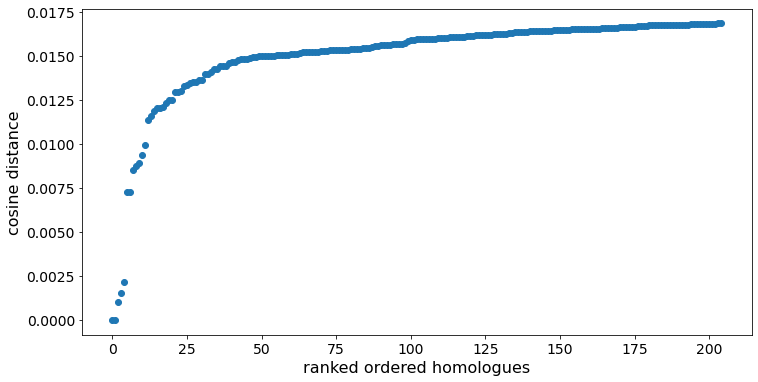

In [285]:
plt.figure(figsize = (12, 6))
plt.plot(df_th_10.d.values, 'o')
plt.xlabel('ranked ordered homologues', fontsize = 16)
yl = plt.ylabel('cosine distance', fontsize = 16)
xt = plt.xticks(fontsize = 14)
yt = plt.yticks(fontsize = 14)

In [288]:
d_th = 0.015
df_th_10[df_th_10.d<= d_th]

,Entry,d,Entry name,Status,Protein names,Gene names,Organism,Length,Sequence,Annotation,Function [CC],Rv_ID
0,A0A1R3Y4V9,4.172325e-07,A0A1R3Y4V9_MYCBO,unreviewed,PROBABLE FEIII-DICITRATE-BINDING PERIPLASMIC L...,fecB BQ2027_MB3070,Mycobacterium bovis (strain ATCC BAA-935 / AF2...,359,MRSTVAVAVAAAVIAASSGCGSDQPAHKASQSMITPTTQIAGAGVL...,1 out of 5,NaN,
1,O53291,4.172325e-07,O53291_MYCTU,unreviewed,Probable FEIII-dicitrate-binding periplasmic l...,fecB Rv3044,Mycobacterium tuberculosis (strain ATCC 25618 ...,359,MRSTVAVAVAAAVIAASSGCGSDQPAHKASQSMITPTTQIAGAGVL...,1 out of 5,NaN,Rv3044
2,Q9CBQ4,1.012385e-03,Q9CBQ4_MYCLE,unreviewed,Putative FeIII-dicitrate transporter lipoprotein,fecB,Mycobacterium leprae (strain TN),364,MLPTRAIVTVAAAVIAVGSGCGSGQPGSKPSSPTRSLLTPTTQIAG...,1 out of 5,NaN,
3,X8B9Y7,1.508176e-03,X8B9Y7_MYCAV,unreviewed,Periplasmic binding family protein,I549_2193,Mycobacterium avium subsp. avium 2285 (R),364,MLFGVIRPARLAAVTAALVVACGGCGSDRPAATTTRSLVTPTTQIA...,1 out of 5,NaN,
4,A0QR99,2.138078e-03,A0QR99_MYCS2,unreviewed,Periplasmic binding protein,MSMEG_1039 MSMEG_2319,Mycolicibacterium smegmatis (strain ATCC 70008...,357,MLTFRPLVGTALIAAAASLISGCGTSGEQPVTQPSMTTSVTKIADA...,1 out of 5,NaN,
5,A0A679LB80,7.263541e-03,A0A679LB80_MYCBO,unreviewed,PROBABLE PERIPLASMIC IRON-TRANSPORT LIPOPROTEIN,BQ2027_MB0271C,Mycobacterium bovis (strain ATCC BAA-935 / AF2...,330,MRQGCSRRGFLQVAEAAAATGLFAGCSSPKPPPGTPGGAAVTITHL...,1 out of 5,NaN,
6,L7N6B2,7.263541e-03,L7N6B2_MYCTU,unreviewed,Probable periplasmic iron-transport lipoprotein,Rv0265c,Mycobacterium tuberculosis (strain ATCC 25618 ...,330,MRQGCSRRGFLQVAEAAAATGLFAGCSSPKPPPGTPGGAAVTITHL...,1 out of 5,NaN,Rv0265c
7,A0QPL3,8.519948e-03,A0QPL3_MYCS2,unreviewed,Periplasmic binding protein,MSMEG_0438,Mycolicibacterium smegmatis (strain ATCC 70008...,317,MPRPLTRRGFLAVTAGLALVAACSTDKPGEVADDGSVTVRHAFGDT...,1 out of 5,NaN,
8,X8BBC0,8.757710e-03,X8BBC0_MYCAV,unreviewed,Periplasmic binding family protein,I549_1019,Mycobacterium avium subsp. avium 2285 (R),224,MLNLDNGIPVDQIAGLKPDLIVAINAGLDADTYQKLSAIAPTVAQS...,1 out of 5,NaN,
9,A0QNF2,8.904159e-03,A0QNF2_MYCS2,unreviewed,Periplasmic binding protein,MSMEG_0020,Mycolicibacterium smegmatis (strain ATCC 70008...,315,MAPIFAAAVAIGMVSACGSESEPAAESGATTISHKFGETTVPENPS...,1 out of 5,NaN,


#### Querying E. coli (other) protein against Mtb / M. smeg

In [ ]:
list_entries_other = ['P0A778']

path_rep = '/home/ajinich/Dropbox/KyuRhee/unknown_function/unknown_redox/data/mohammed/sakila_ESM/TotalProteomes/'

Xs_list = []
list_err = []

for entry in list_entries_other:
    fn_full = os.path.join(path_rep, entry+'.pt')
    try:
        embs = torch.load(fn_full)
        Xs_list.append(embs['mean_representations'][EMB_LAYER])
    except:
        list_err.append(entry)
X_other = torch.stack(Xs_list, dim=0).numpy()
x_test = X_other.copy()